In [1]:
import sys
sys.path.append('..')
import numpy as np
import cupy as cp
import dask.array as da
import jax.numpy as jnp

import matplotlib.pyplot as plt


# FirstDerviative

6
True


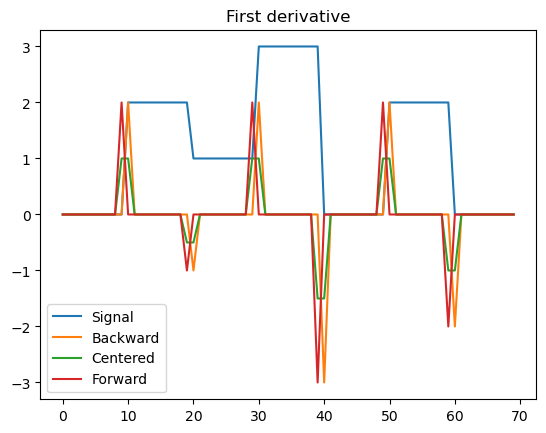

6
True


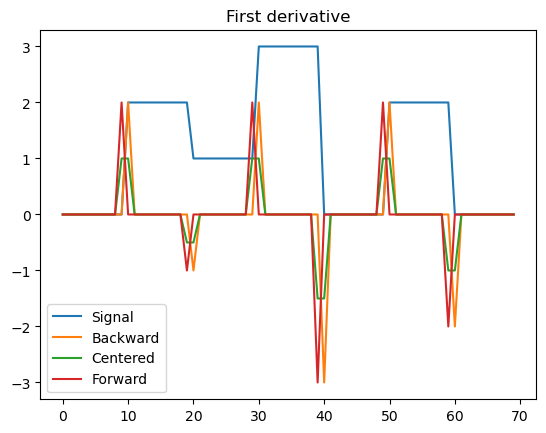

In [2]:
from pycsou.linop.diff import FirstDerivative

for xp in [np, cp]:
    x = xp.repeat(xp.array([0,2,1,3,0,2,0]), 10)
    Dop = FirstDerivative(size=x.size)
    y = Dop * x
    print(xp.sum(xp.abs(y) > 0))
    # 6
    print(xp.allclose(y, xp.diff(x, append=0)))
    # True


    Dop_bwd = FirstDerivative(size=x.size, kind='backward')
    Dop_fwd = FirstDerivative(size=x.size, kind='forward')
    Dop_cent = FirstDerivative(size=x.size, kind='centered')
    y_bwd = Dop_bwd * x
    y_cent = Dop_cent * x
    y_fwd = Dop_fwd * x
    plt.figure()
    plt.plot(xp.arange(x.size).get() if xp == cp else xp.arange(x.size), x.get() if xp == cp else x)
    plt.plot(xp.arange(x.size).get() if xp == cp else xp.arange(x.size), y_bwd.get() if xp == cp else y_bwd)
    plt.plot(xp.arange(x.size).get() if xp == cp else xp.arange(x.size), y_cent.get() if xp == cp else y_cent)
    plt.plot(xp.arange(x.size).get() if xp == cp else xp.arange(x.size), y_fwd.get() if xp == cp else y_fwd)

    plt.legend(['Signal', 'Backward', 'Centered', 'Forward'])
    plt.title('First derivative')
    plt.show()

# SecondDerivative

https://docs.cupy.dev/en/stable/reference/generated/cupy.piecewise.html?highlight=piecewise#cupy.piecewise

Warning
This function currently doesn’t support callable functions, args and kw parameters.

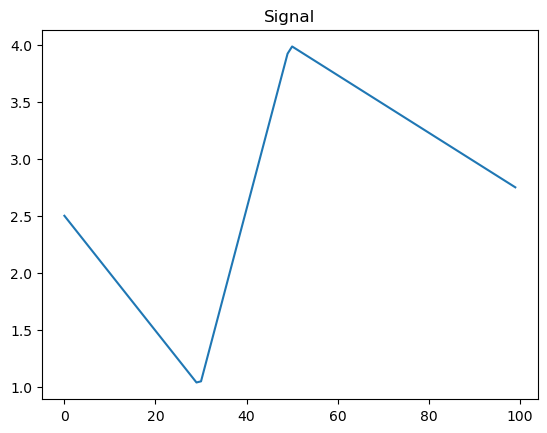

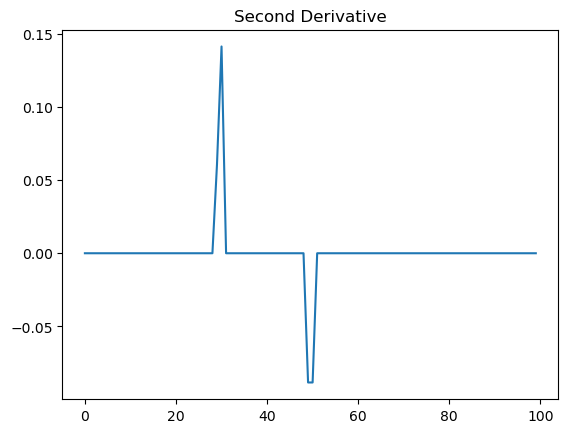

NotImplementedError: Callable functions are not supported currently

In [3]:
from pycsou.linop.diff import SecondDerivative


x = np.linspace(-2.5, 2.5, 100)
z = np.piecewise(x, [x < -1, (x >= - 1) * (x<0), x>=0], [lambda x: -x, lambda x: 3 * x + 4, lambda x: -0.5 * x + 4])
Dop = SecondDerivative(size=x.size)
y = Dop * z

plt.figure()
plt.plot(np.arange(x.size), z)
plt.title('Signal')
plt.show()
plt.figure()
plt.plot(np.arange(x.size), y)
plt.title('Second Derivative')
plt.show()


# CuPy
x = cp.linspace(-2.5, 2.5, 100)
# https://docs.cupy.dev/en/stable/reference/generated/cupy.piecewise.html?highlight=piecewise#cupy.piecewise
# Warning
# This function currently doesn’t support callable functions, args and kw parameters.
z = cp.piecewise(x, [x < -1, (x >= - 1) * (x<0), x>=0], [lambda x: -x, lambda x: 3 * x + 4, lambda x: -0.5 * x + 4])
Dop = SecondDerivative(size=x.size)
y = Dop * z

plt.figure()
plt.plot(cp.arange(x.size).get(), z.get())
plt.title('Signal')
plt.show()
plt.figure()
plt.plot(cp.arange(x.size).get(), y.get())
plt.title('Second Derivative')
plt.show()

# GeneralisedDerivative

True


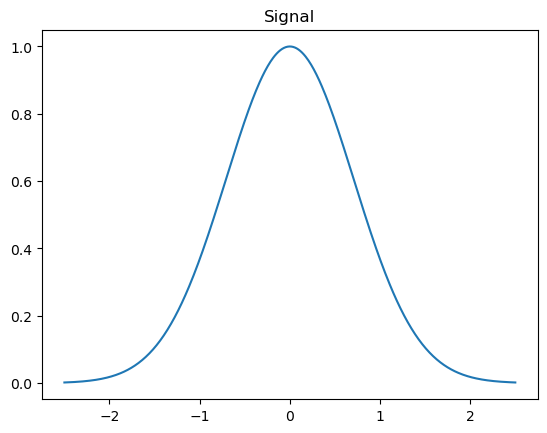

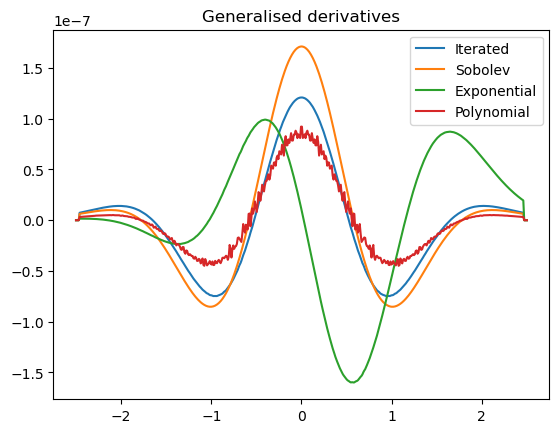

True


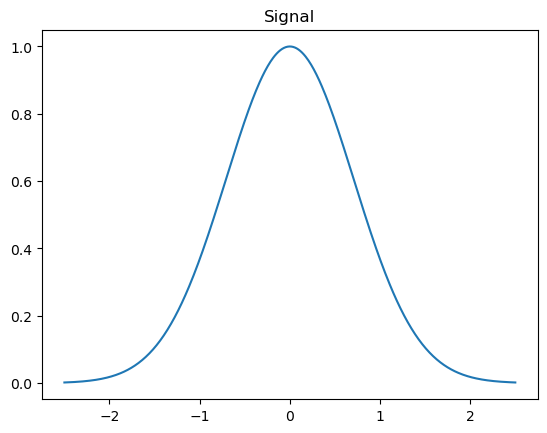

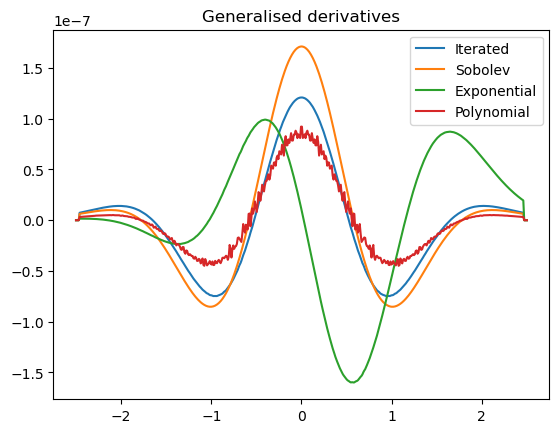

In [4]:
import numpy as np
from pycsou.linop.diff import GeneralisedDerivative, FirstDerivative


x = np.linspace(-5, 5, 100)
z = np.sinc(x)
Dop = GeneralisedDerivative(size=x.size, kind_op='iterated', order=1, kind_diff='forward')
D = FirstDerivative(size=x.size, kind='forward')
print(np.allclose(Dop * z, D * z))
# True


x  = np.linspace(-2.5, 2.5, 500)
z = np.exp(-x ** 2)
Dop_it = GeneralisedDerivative(size=x.size, kind_op='iterated', order=4)
Dop_sob = GeneralisedDerivative(size=x.size, kind_op='sobolev', order=2, constant=1e-2, xp=np)
Dop_exp = GeneralisedDerivative(size=x.size, kind_op='exponential', order=4, constant=-1e-2)
Dop_pol = GeneralisedDerivative(size=x.size, kind_op='polynomial',
                                coeffs= 1/2 * np.array([1e-8, 0, -2 * 1e-4, 0, 1]))
y_it = Dop_it * z
y_sob = Dop_sob * z
y_exp = Dop_exp * z
y_pol = Dop_pol * z
plt.figure()
plt.plot(x, z)
plt.title('Signal')
plt.show()
plt.figure()
plt.plot(x, y_it)
plt.plot(x, y_sob)
plt.plot(x, y_exp)
plt.plot(x, y_pol)
plt.legend(['Iterated', 'Sobolev', 'Exponential', 'Polynomial'])
plt.title('Generalised derivatives')
plt.show()


#Cupy

x = cp.linspace(-5, 5, 100)
z = cp.sinc(x)
Dop = GeneralisedDerivative(size=x.size, kind_op='iterated', order=1, kind_diff='forward')
D = FirstDerivative(size=x.size, kind='forward')
print(cp.allclose(Dop * z, D * z))
# True

x  = cp.linspace(-2.5, 2.5, 500)
z = cp.exp(-x ** 2)
Dop_it = GeneralisedDerivative(size=x.size, kind_op='iterated', order=4)
Dop_sob = GeneralisedDerivative(size=x.size, kind_op='sobolev', order=2, constant=1e-2, xp=cp)
Dop_exp = GeneralisedDerivative(size=x.size, kind_op='exponential', order=4, constant=-1e-2, xp=cp)
Dop_pol = GeneralisedDerivative(size=x.size, kind_op='polynomial',
                                coeffs= 1/2 * cp.array([1e-8, 0, -2 * 1e-4, 0, 1]), xp = cp)
y_it = Dop_it * z
y_sob = Dop_sob * z
y_exp = Dop_exp * z
y_pol = Dop_pol * z
plt.figure()
plt.plot(x.get(), z.get())
plt.title('Signal')
plt.show()
plt.figure()
plt.plot(x.get(), y_it.get())
plt.plot(x.get(), y_sob.get())
plt.plot(x.get(), y_exp.get())
plt.plot(x.get(), y_pol.get())
plt.legend(['Iterated', 'Sobolev', 'Exponential', 'Polynomial'])
plt.title('Generalised derivatives')
plt.show()

# FirstDirectionalDerivative

True


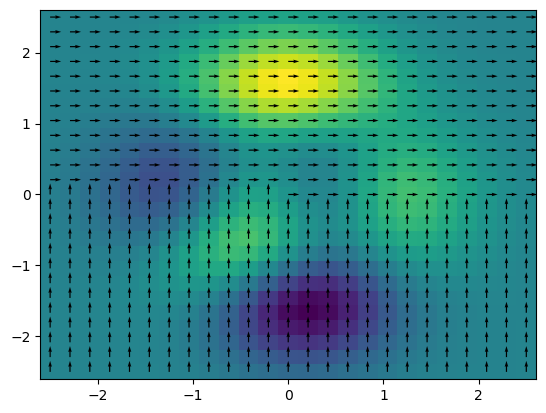

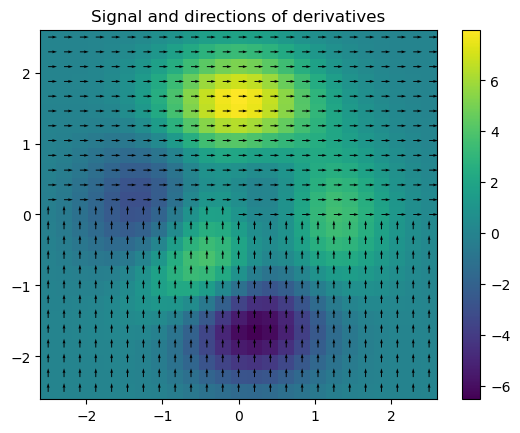

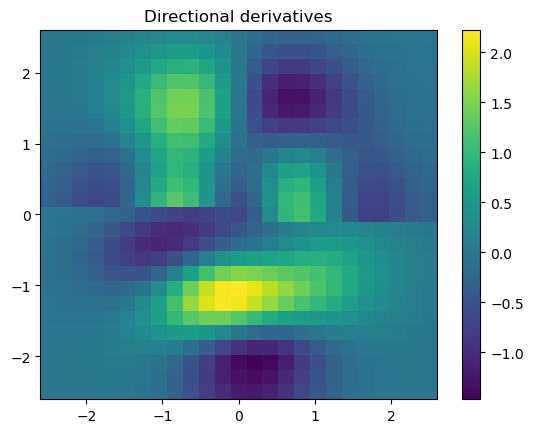

True


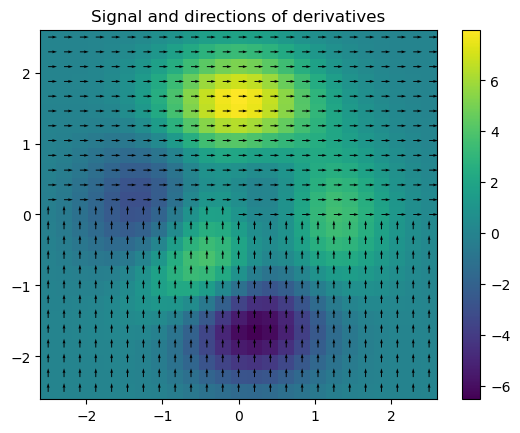

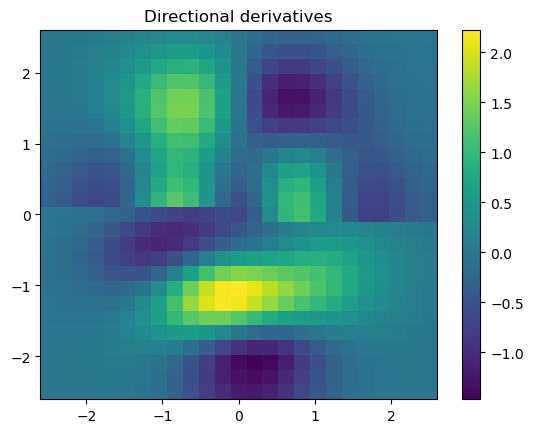

In [7]:
import numpy as np
from pycsou.linop.diff import FirstDirectionalDerivative, FirstDerivative
from pycsou.util.misc import peaks

x = np.linspace(-2.5, 2.5, 100)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
direction = np.array([1,0])
Dop = FirstDirectionalDerivative(shape=Z.shape, directions=direction, kind='forward')
D = FirstDerivative(size=Z.size, shape=Z.shape, kind='forward')
print(np.allclose(Dop * Z.flatten(), D * Z.flatten()))
# True

x  = np.linspace(-2.5, 2.5, 25)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
directions = np.zeros(shape=(2,Z.size))
directions[0, :Z.size//2] = 1
directions[1, Z.size//2:] = 1
Dop = FirstDirectionalDerivative(shape=Z.shape, directions=directions)
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X,Y,Z, shading='auto')
plt.quiver(x, x, directions[1].reshape(X.shape), directions[0].reshape(X.shape))
plt.colorbar(h)
plt.title('Signal and directions of derivatives')
plt.figure()
h = plt.pcolormesh(X,Y,y.reshape(X.shape), shading='auto')
plt.colorbar(h)
plt.title('Directional derivatives')
plt.show()


# Cupy
x = cp.linspace(-2.5, 2.5, 100)
X,Y = cp.meshgrid(x,x)
Z = peaks(X, Y)
direction = cp.array([1,0])
Dop = FirstDirectionalDerivative(shape=Z.shape, directions=direction, kind='forward')
D = FirstDerivative(size=Z.size, shape=Z.shape, kind='forward')
print(cp.allclose(Dop * Z.flatten(), D * Z.flatten()))
# True

x  = cp.linspace(-2.5, 2.5, 25)
X,Y = cp.meshgrid(x,x)
Z = peaks(X, Y)
directions = cp.zeros(shape=(2,Z.size))
directions[0, :Z.size//2] = 1
directions[1, Z.size//2:] = 1
Dop = FirstDirectionalDerivative(shape=Z.shape, directions=directions)
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),Z.get(), shading='auto')
plt.quiver(x.get(), x.get(), directions[1].reshape(X.shape).get(), directions[0].reshape(X.shape).get())
plt.colorbar(h)
plt.title('Signal and directions of derivatives')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y.reshape(X.shape).get(), shading='auto')
plt.colorbar(h)
plt.title('Directional derivatives')
plt.show()

# SecondDirectionalDerivative

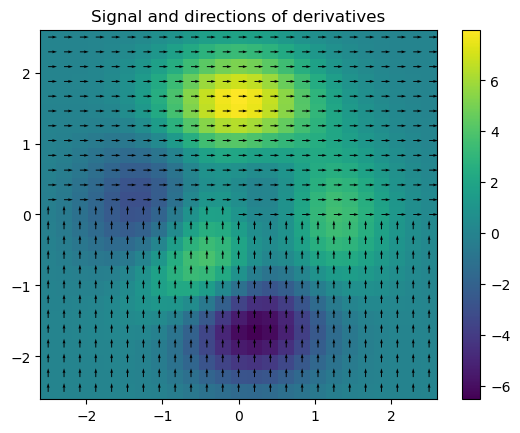

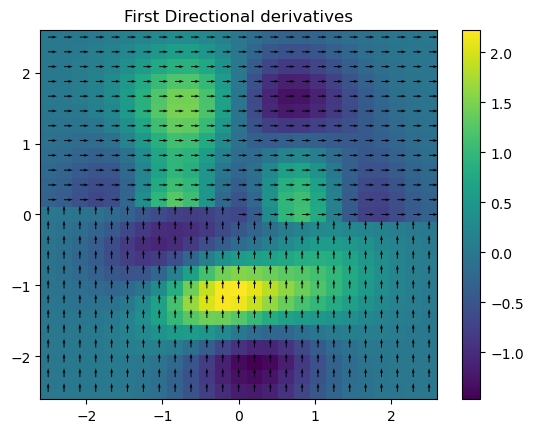

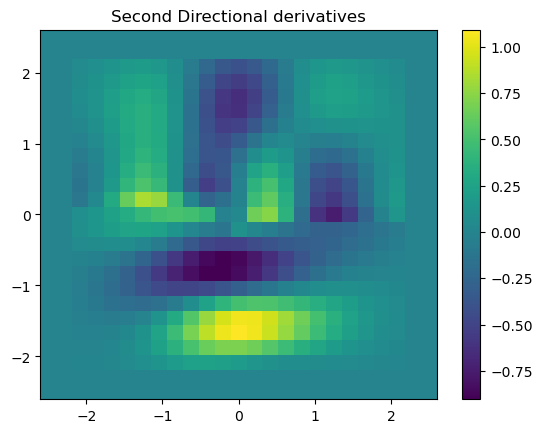

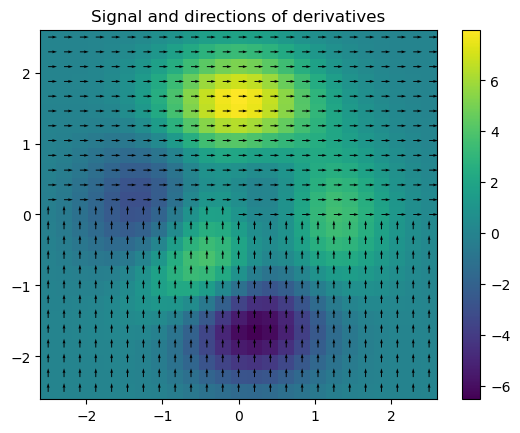

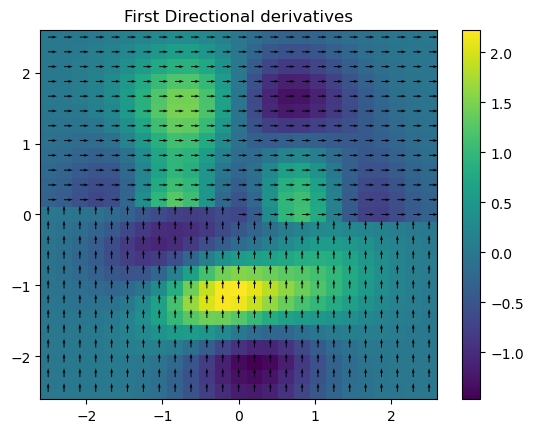

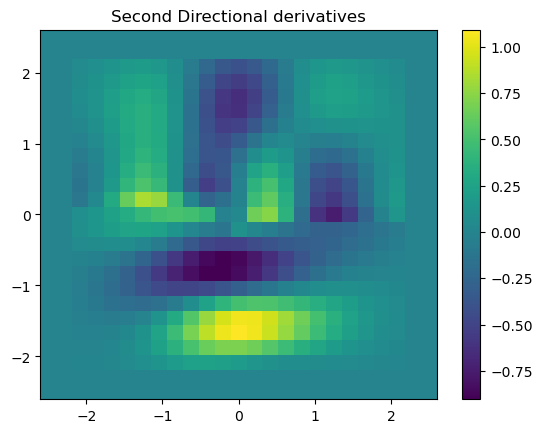

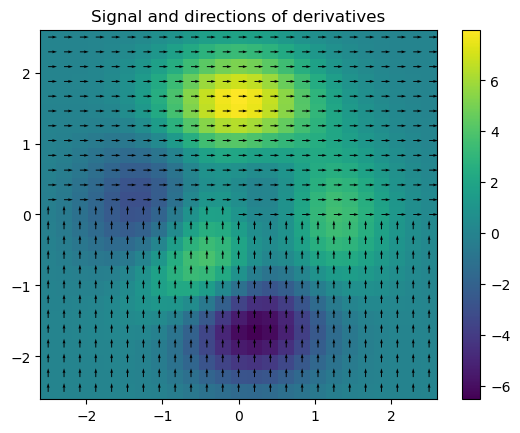

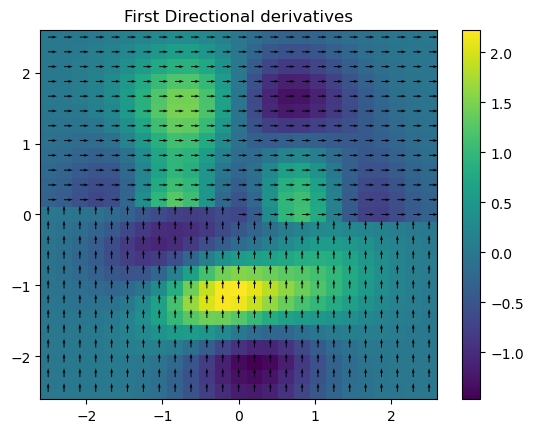

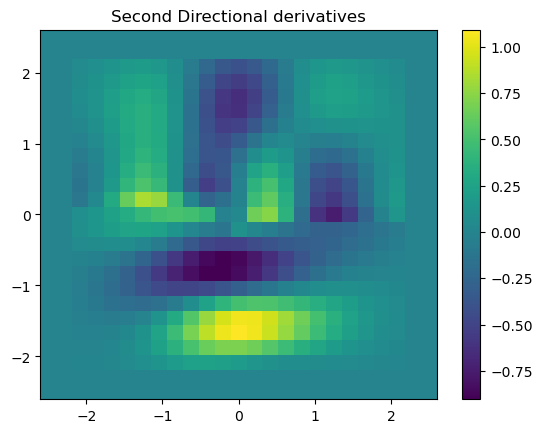

In [13]:
from pycsou.linop.diff import SecondDirectionalDerivative
from pycsou.util.misc import peaks

x = np.linspace(-2.5, 2.5, 100)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
direction = np.array([1,0])
Dop = SecondDirectionalDerivative(shape=Z.shape, directions=direction)
dir_d2 = (Dop * Z.reshape(-1)).reshape(Z.shape)

x  = np.linspace(-2.5, 2.5, 25)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
directions = np.zeros(shape=(2,Z.size))
directions[0, :Z.size//2] = 1
directions[1, Z.size//2:] = 1
Dop = FirstDirectionalDerivative(shape=Z.shape, directions=directions)
Dop2 = SecondDirectionalDerivative(shape=Z.shape, directions=directions)
y = Dop * Z.flatten()
y2 = Dop2 * Z.flatten()

plt.figure()
h = plt.pcolormesh(X,Y,Z, shading='auto')
plt.quiver(x, x, directions[1].reshape(X.shape), directions[0].reshape(X.shape))
plt.colorbar(h)
plt.title('Signal and directions of derivatives')
plt.figure()
h = plt.pcolormesh(X,Y,y.reshape(X.shape), shading='auto')
plt.quiver(x, x, directions[1].reshape(X.shape), directions[0].reshape(X.shape))
plt.colorbar(h)
plt.title('First Directional derivatives')
plt.figure()
h = plt.pcolormesh(X,Y,y2.reshape(X.shape), shading='auto')
plt.colorbar(h)
plt.title('Second Directional derivatives')
plt.show()


# Cupy
x = cp.linspace(-2.5, 2.5, 100)
X,Y = cp.meshgrid(x,x)
Z = peaks(X, Y)
direction = cp.array([1,0])
Dop = SecondDirectionalDerivative(shape=Z.shape, directions=direction)
dir_d2 = (Dop * Z.reshape(-1)).reshape(Z.shape)

x  = cp.linspace(-2.5, 2.5, 25)
X,Y = cp.meshgrid(x,x)
Z = peaks(X, Y)
directions = cp.zeros(shape=(2,Z.size))
directions[0, :Z.size//2] = 1
directions[1, Z.size//2:] = 1
Dop = FirstDirectionalDerivative(shape=Z.shape, directions=directions)
Dop2 = SecondDirectionalDerivative(shape=Z.shape, directions=directions)
y = Dop * Z.flatten()
y2 = Dop2 * Z.flatten()

plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),Z.get(), shading='auto')
plt.quiver(x.get(), x.get(), directions[1].reshape(X.shape).get(), directions[0].reshape(X.shape).get())
plt.colorbar(h)
plt.title('Signal and directions of derivatives')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y.reshape(X.shape).get(), shading='auto')
plt.quiver(x.get(), x.get(), directions[1].reshape(X.shape).get(), directions[0].reshape(X.shape).get())
plt.colorbar(h)
plt.title('First Directional derivatives')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y2.reshape(X.shape).get(), shading='auto')
plt.colorbar(h)
plt.title('Second Directional derivatives')
plt.show()


# DirectionalGradient

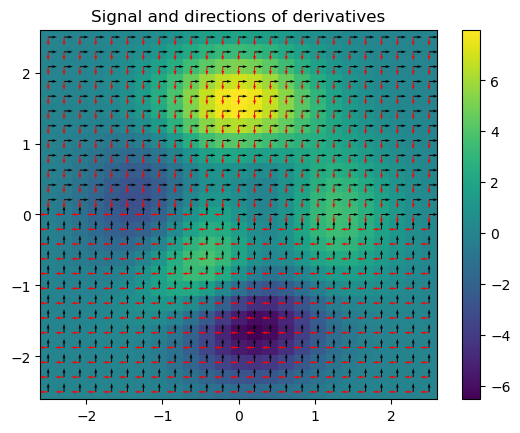

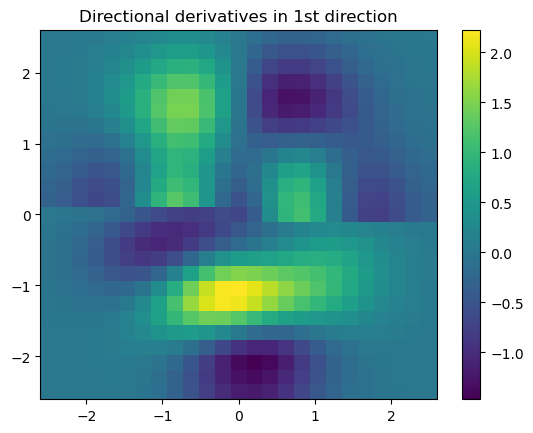

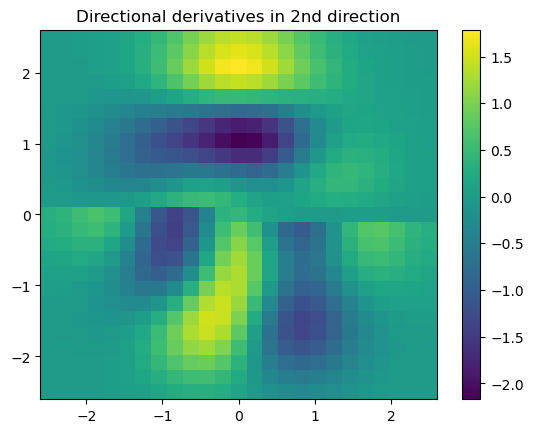

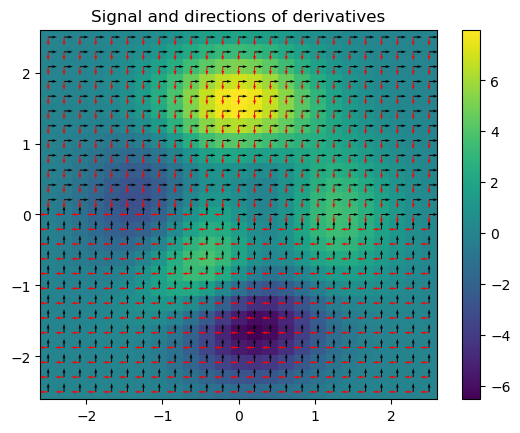

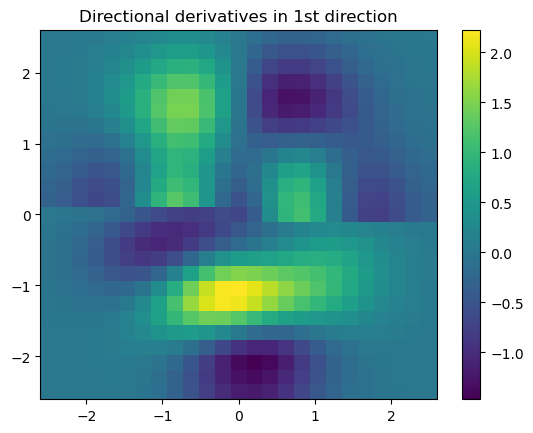

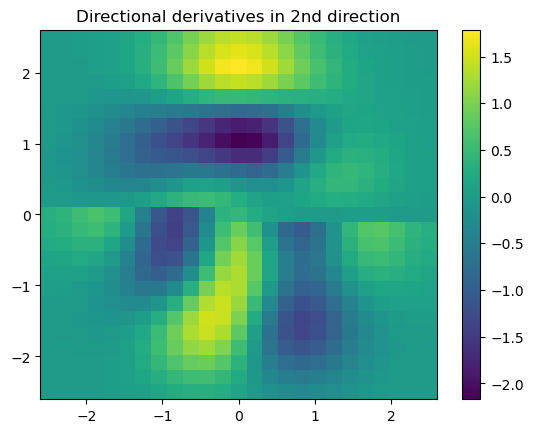

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from pycsou.linop.diff import FirstDirectionalDerivative, DirectionalGradient
from pycsou.util.misc import peaks

x  = np.linspace(-2.5, 2.5, 25)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
directions1 = np.zeros(shape=(2,Z.size))
directions1[0, :Z.size//2] = 1
directions1[1, Z.size//2:] = 1
directions2 = np.zeros(shape=(2,Z.size))
directions2[1, :Z.size//2] = -1
directions2[0, Z.size//2:] = -1
Dop1 = FirstDirectionalDerivative(shape=Z.shape, directions=directions1)
Dop2 = FirstDirectionalDerivative(shape=Z.shape, directions=directions2)
Dop = DirectionalGradient([Dop1, Dop2])
y = Dop * Z.flatten()
plt.figure()
h = plt.pcolormesh(X,Y,Z, shading='auto')
plt.quiver(x, x, directions1[1].reshape(X.shape), directions1[0].reshape(X.shape))
plt.quiver(x, x, directions2[1].reshape(X.shape), directions2[0].reshape(X.shape), color='red')
plt.colorbar(h)
plt.title('Signal and directions of derivatives')
plt.figure()
h = plt.pcolormesh(X,Y,y[:Z.size].reshape(X.shape), shading='auto')
plt.colorbar(h)
plt.title('Directional derivatives in 1st direction')
plt.figure()
h = plt.pcolormesh(X,Y,y[Z.size:].reshape(X.shape), shading='auto')
plt.colorbar(h)
plt.title('Directional derivatives in 2nd direction')
plt.show()

# Cupy

x  = cp.linspace(-2.5, 2.5, 25)
X,Y = cp.meshgrid(x,x)
Z = peaks(X, Y)
directions1 = cp.zeros(shape=(2,Z.size))
directions1[0, :Z.size//2] = 1
directions1[1, Z.size//2:] = 1
directions2 = cp.zeros(shape=(2,Z.size))
directions2[1, :Z.size//2] = -1
directions2[0, Z.size//2:] = -1
Dop1 = FirstDirectionalDerivative(shape=Z.shape, directions=directions1)
Dop2 = FirstDirectionalDerivative(shape=Z.shape, directions=directions2)
Dop = DirectionalGradient([Dop1, Dop2])
y = Dop * Z.flatten()
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),Z.get(), shading='auto')
plt.quiver(x.get(), x.get(), directions1[1].reshape(X.shape).get(), directions1[0].reshape(X.shape).get())
plt.quiver(x.get(), x.get(), directions2[1].reshape(X.shape).get(), directions2[0].reshape(X.shape).get(), color='red')
plt.colorbar(h)
plt.title('Signal and directions of derivatives')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y[:Z.size].reshape(X.shape).get(), shading='auto')
plt.colorbar(h)
plt.title('Directional derivatives in 1st direction')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y[Z.size:].reshape(X.shape).get(), shading='auto')
plt.colorbar(h)
plt.title('Directional derivatives in 2nd direction')
plt.show()

# DirectionalLaplacian

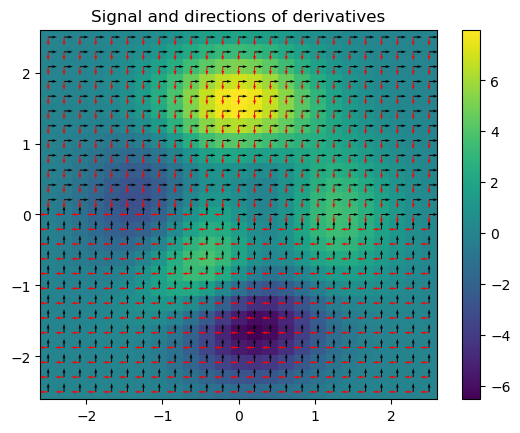

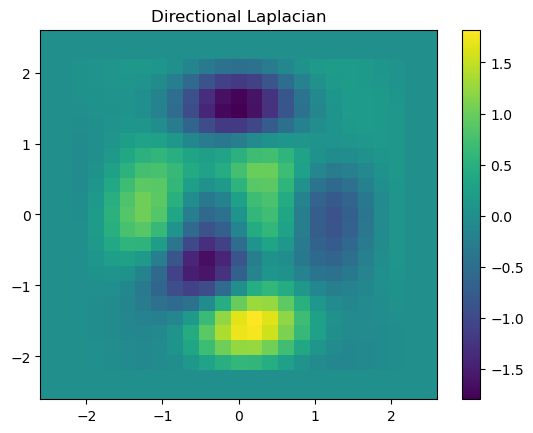

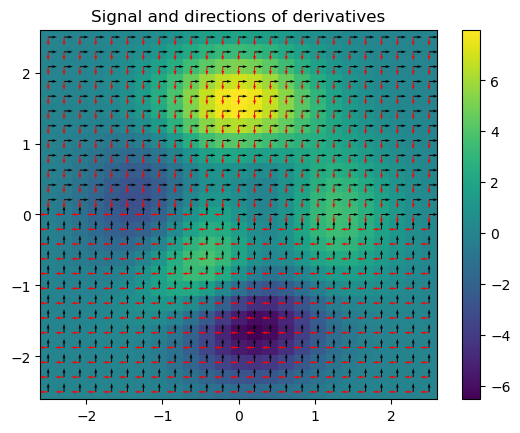

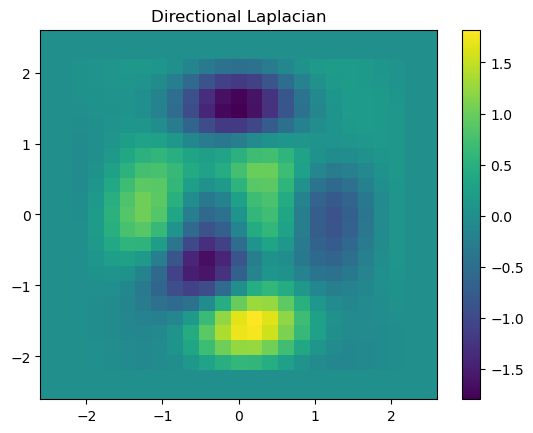

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from pycsou.linop.diff import SecondDirectionalDerivative, DirectionalLaplacian
from pycsou.util.misc import peaks

x  = np.linspace(-2.5, 2.5, 25)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
directions1 = np.zeros(shape=(2,Z.size))
directions1[0, :Z.size//2] = 1
directions1[1, Z.size//2:] = 1
directions2 = np.zeros(shape=(2,Z.size))
directions2[1, :Z.size//2] = -1
directions2[0, Z.size//2:] = -1
Dop1 = SecondDirectionalDerivative(shape=Z.shape, directions=directions1)
Dop2 = SecondDirectionalDerivative(shape=Z.shape, directions=directions2)
Dop = DirectionalLaplacian([Dop1, Dop2])
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X,Y,Z, shading='auto')
plt.quiver(x, x, directions1[1].reshape(X.shape), directions1[0].reshape(X.shape))
plt.quiver(x, x, directions2[1].reshape(X.shape), directions2[0].reshape(X.shape), color='red')
plt.colorbar(h)
plt.title('Signal and directions of derivatives')
plt.figure()
h = plt.pcolormesh(X,Y,y.reshape(X.shape), shading='auto')
plt.colorbar(h)
plt.title('Directional Laplacian')
plt.show()

# Cupy

x  = xp.linspace(-2.5, 2.5, 25)
X,Y = xp.meshgrid(x,x)
Z = peaks(X, Y)
directions1 = xp.zeros(shape=(2,Z.size))
directions1[0, :Z.size//2] = 1
directions1[1, Z.size//2:] = 1
directions2 = xp.zeros(shape=(2,Z.size))
directions2[1, :Z.size//2] = -1
directions2[0, Z.size//2:] = -1
Dop1 = SecondDirectionalDerivative(shape=Z.shape, directions=directions1)
Dop2 = SecondDirectionalDerivative(shape=Z.shape, directions=directions2)
Dop = DirectionalLaplacian([Dop1, Dop2])
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),Z.get(), shading='auto')
plt.quiver(x.get(), x.get(), directions1[1].reshape(X.shape).get(), directions1[0].reshape(X.shape).get())
plt.quiver(x.get(), x.get(), directions2[1].reshape(X.shape).get(), directions2[0].reshape(X.shape).get(), color='red')
plt.colorbar(h)
plt.title('Signal and directions of derivatives')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y.reshape(X.shape).get(), shading='auto')
plt.colorbar(h)
plt.title('Directional Laplacian')
plt.show()

# Gradient

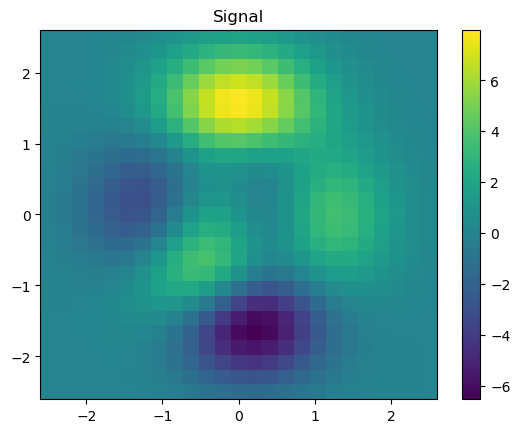

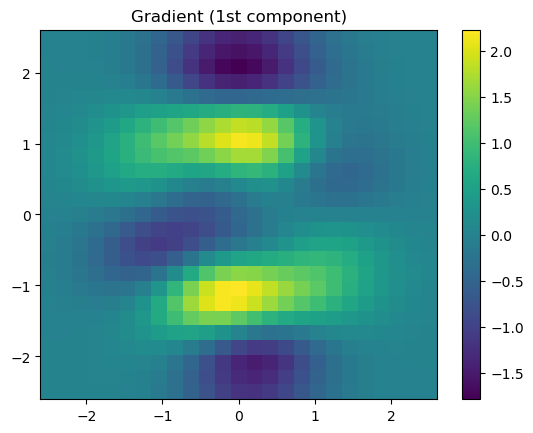

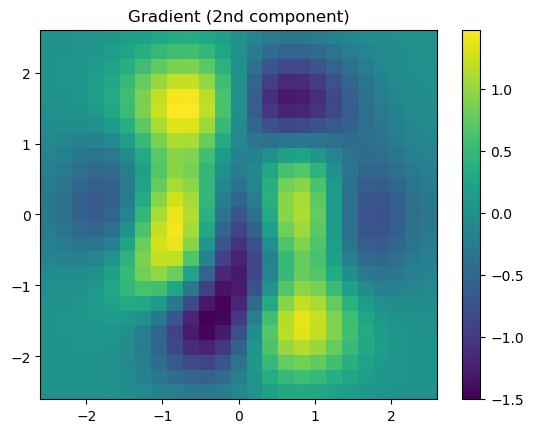

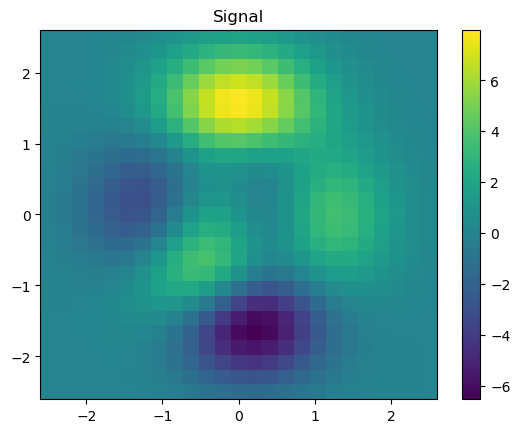

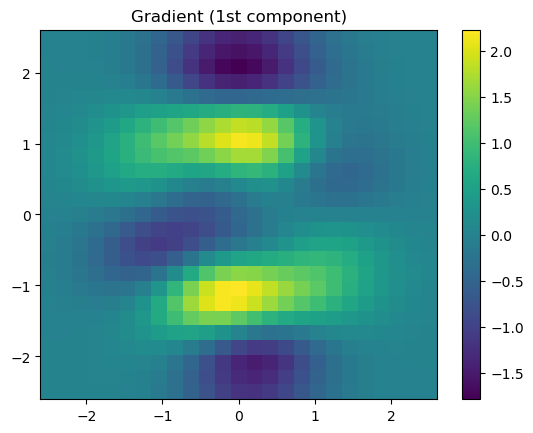

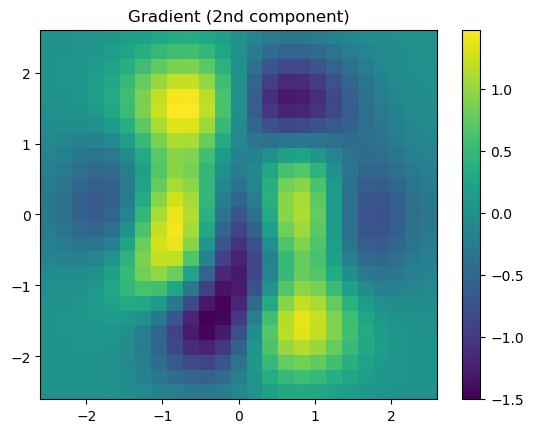

In [17]:
import numpy as np
from pycsou.linop.diff import Gradient, FirstDerivative
from pycsou.util.misc import peaks

x = np.linspace(-2.5, 2.5, 100)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
Nabla = Gradient(shape=Z.shape, kind='forward')
D = FirstDerivative(size=Z.size, shape=Z.shape, kind='forward')
np.allclose((Nabla * Z.flatten())[:Z.size], D * Z.flatten())
# True

x  = np.linspace(-2.5, 2.5, 25)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
Dop = Gradient(shape=Z.shape)
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X,Y,Z, shading='auto')
plt.colorbar(h)
plt.title('Signal')
plt.figure()
h = plt.pcolormesh(X,Y,y[:Z.size].reshape(X.shape), shading='auto')
plt.colorbar(h)
plt.title('Gradient (1st component)')
plt.figure()
h = plt.pcolormesh(X,Y,y[Z.size:].reshape(X.shape), shading='auto')
plt.colorbar(h)
plt.title('Gradient (2nd component)')
plt.show()

# Cupy

x = cp.linspace(-2.5, 2.5, 100)
X,Y = cp.meshgrid(x,x)
Z = peaks(X, Y)
Nabla = Gradient(shape=Z.shape, kind='forward')
D = FirstDerivative(size=Z.size, shape=Z.shape, kind='forward')
cp.allclose((Nabla * Z.flatten())[:Z.size], D * Z.flatten())
# True

x  = cp.linspace(-2.5, 2.5, 25)
X,Y = cp.meshgrid(x,x)
Z = peaks(X, Y)
Dop = Gradient(shape=Z.shape)
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),Z.get(), shading='auto')
plt.colorbar(h)
plt.title('Signal')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y[:Z.size].reshape(X.shape).get(), shading='auto')
plt.colorbar(h)
plt.title('Gradient (1st component)')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y[Z.size:].reshape(X.shape).get(), shading='auto')
plt.colorbar(h)
plt.title('Gradient (2nd component)')
plt.show()

# Laplacian

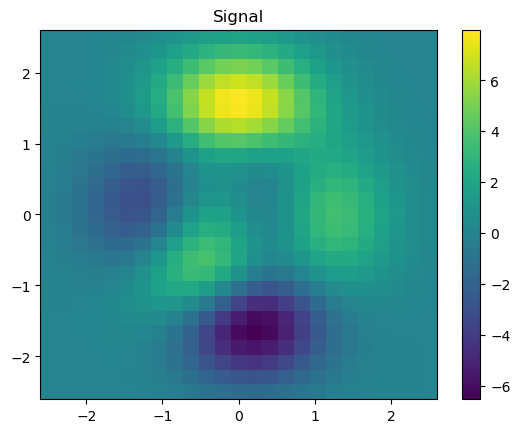

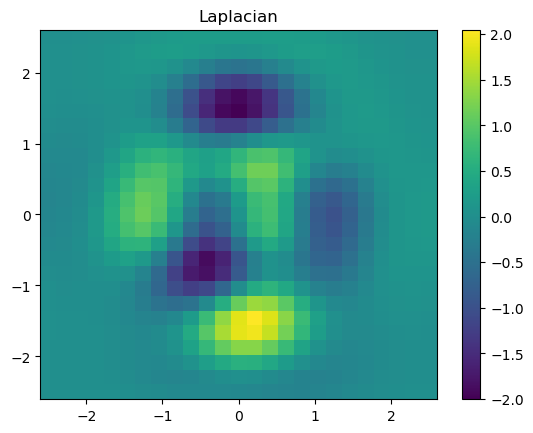

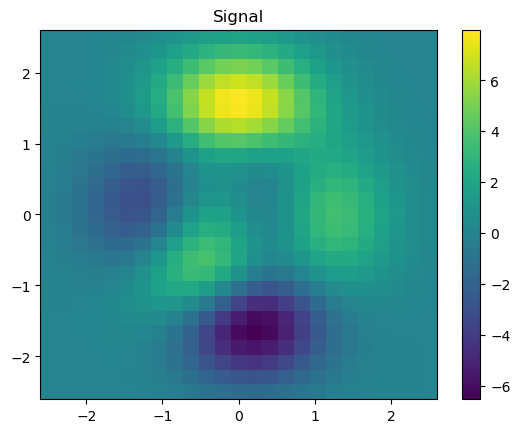

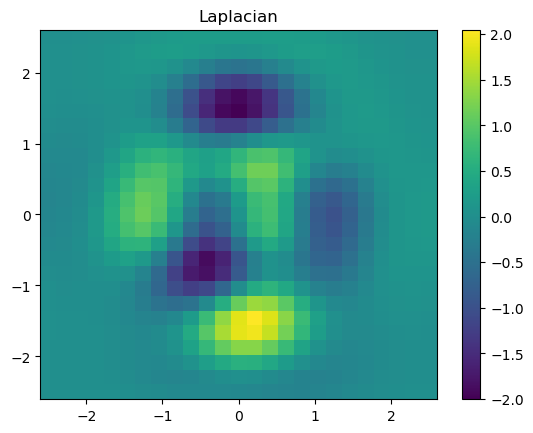

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from pycsou.linop.diff import Laplacian
from pycsou.util.misc import peaks

x  = np.linspace(-2.5, 2.5, 25)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
Dop = Laplacian(shape=Z.shape)
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X,Y,Z, shading='auto')
plt.colorbar(h)
plt.title('Signal')
plt.figure()
h = plt.pcolormesh(X,Y,y.reshape(X.shape), shading='auto')
plt.colorbar(h)
plt.title('Laplacian')
plt.show()

# Cupy

x  = cp.linspace(-2.5, 2.5, 25)
X,Y = cp.meshgrid(x,x)
Z = peaks(X, Y)
Dop = Laplacian(shape=Z.shape)
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),Z.get(), shading='auto')
plt.colorbar(h)
plt.title('Signal')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y.reshape(X.shape).get(), shading='auto')
plt.colorbar(h)
plt.title('Laplacian')
plt.show()

# GeneralisedLaplacian

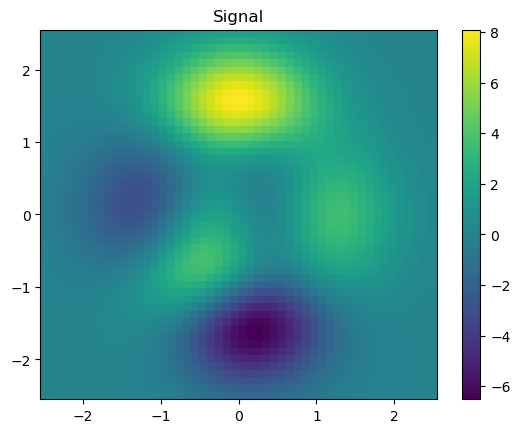

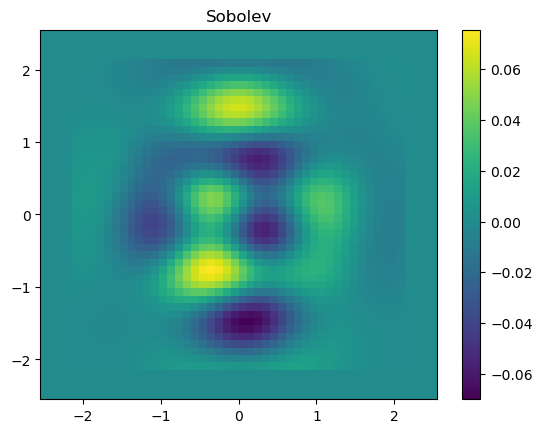

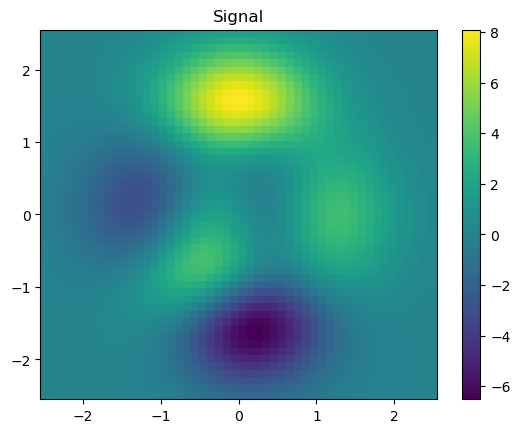

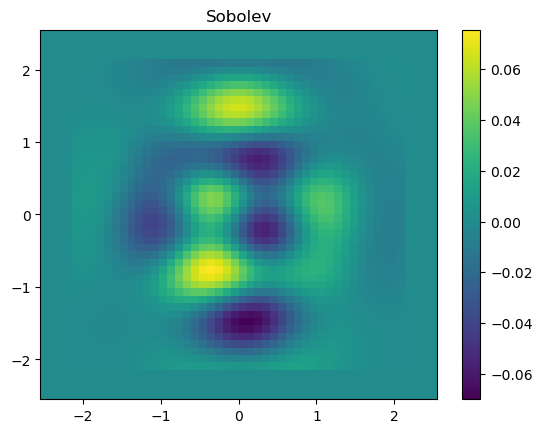

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from pycsou.linop.diff import GeneralisedLaplacian
from pycsou.util.misc import peaks

x  = np.linspace(-2.5, 2.5, 50)
X,Y = np.meshgrid(x,x)
Z = peaks(X, Y)
Dop = GeneralisedLaplacian(shape=Z.shape, kind='sobolev', order=2, constant=0)
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X,Y,Z, shading='auto')
plt.colorbar(h)
plt.title('Signal')
plt.figure()
h = plt.pcolormesh(X,Y,y.reshape(X.shape), shading='auto')
plt.colorbar(h)
plt.title('Sobolev')
plt.show()

# Cupy

x  = cp.linspace(-2.5, 2.5, 50)
X,Y = cp.meshgrid(x,x)
Z = peaks(X, Y)
Dop = GeneralisedLaplacian(shape=Z.shape, kind='sobolev', order=2, constant=0)
y = Dop * Z.flatten()

plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),Z.get(), shading='auto')
plt.colorbar(h)
plt.title('Signal')
plt.figure()
h = plt.pcolormesh(X.get(),Y.get(),y.reshape(X.shape).get(), shading='auto')
plt.colorbar(h)
plt.title('Sobolev')
plt.show()

# Integration1D

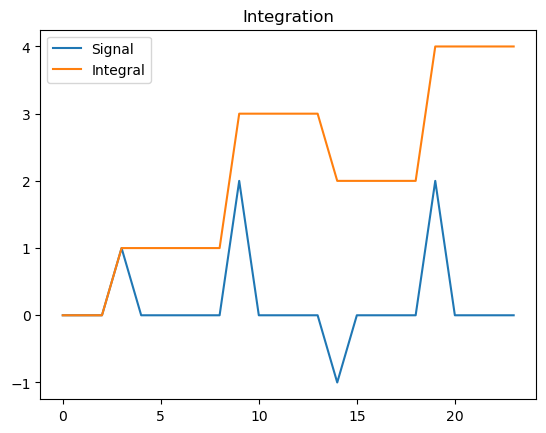

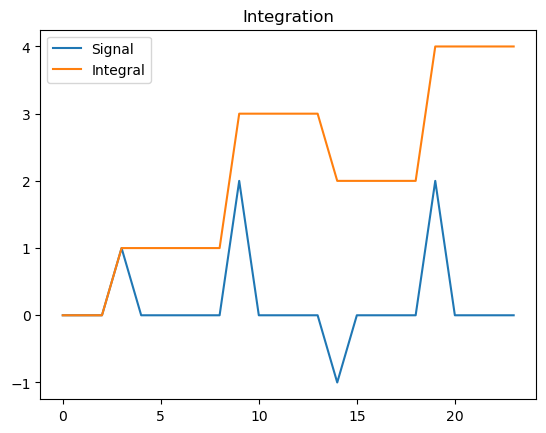

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from pycsou.linop.diff import Integration1D

x = np.array([0,0,0,1,0,0,0,0,0,2,0,0,0,0,-1,0,0,0,0,2,0,0,0,0])
Int = Integration1D(size=x.size)
y = Int * x
plt.figure()
plt.plot(np.arange(x.size), x)
plt.plot(np.arange(x.size), y)
plt.legend(['Signal', 'Integral'])
plt.title('Integration')
plt.show()

# Cupy

x = cp.array([0,0,0,1,0,0,0,0,0,2,0,0,0,0,-1,0,0,0,0,2,0,0,0,0])
Int = Integration1D(size=x.size)
y = Int * x
plt.figure()
plt.plot(cp.arange(x.size).get(), x.get())
plt.plot(cp.arange(x.size).get(), y.get())
plt.legend(['Signal', 'Integral'])
plt.title('Integration')
plt.show()